# EDA

In [2]:
# Import necessary packages
import pandas as pd
import sweetviz as sv

In [3]:
# Load dataset

filename = r'..\data\raw\raw_data.csv'
df = pd.read_csv(filename)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 35 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Age                       1470 non-null   int64 
 1   Attrition                 1470 non-null   object
 2   BusinessTravel            1470 non-null   object
 3   DailyRate                 1470 non-null   int64 
 4   Department                1470 non-null   object
 5   DistanceFromHome          1470 non-null   int64 
 6   Education                 1470 non-null   int64 
 7   EducationField            1470 non-null   object
 8   EmployeeCount             1470 non-null   int64 
 9   EmployeeNumber            1470 non-null   int64 
 10  EnvironmentSatisfaction   1470 non-null   int64 
 11  Gender                    1470 non-null   object
 12  HourlyRate                1470 non-null   int64 
 13  JobInvolvement            1470 non-null   int64 
 14  JobLevel                

In [4]:
# Analyze the dataset
report = sv.analyze(df)

                                             |          | [  0%]   00:00 -> (? left)

In [5]:
# Show the report in a form of an HTML file
report.show_html('../reports/sweetviz_eda_report.html', open_browser=False)

Report ../reports/sweetviz_eda_report.html was generated.


Imported v0.1.901. Please call AutoViz in this sequence:
    AV = AutoViz_Class()
    %matplotlib inline
    dfte = AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=1, lowess=False,
               chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30, save_plot_dir=None)
Shape of your Data Set loaded: (1470, 35)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
  Printing upto 30 columns (max) in each category:
    Numeric Columns : []
    Integer-Categorical Columns: ['Age', 'DailyRate', 'DistanceFromHome', 'Education', 'EnvironmentSatisfaction', 'HourlyRate', 'JobInvolvement', 'JobLevel', 'JobSatisfaction', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked', 'PercentSalaryHike', 'RelationshipSatisfaction

,Data Type,Missing Values%,Unique Values%,Minimum Value,Maximum Value,DQ Issue
Age,int64,0.000000,2,18.000000,60.000000,No issue
Attrition,object,0.000000,0,,,No issue
BusinessTravel,object,0.000000,0,,,No issue
DailyRate,int64,0.000000,60,102.000000,1499.000000,No issue
Department,object,0.000000,0,,,No issue
DistanceFromHome,int64,0.000000,1,1.000000,29.000000,No issue
Education,int64,0.000000,0,1.000000,5.000000,No issue
EducationField,object,0.000000,0,,,No issue
EmployeeCount,int64,0.000000,0,1.000000,1.000000,Possible Zero-variance or low information colum: drop before modeling step.
EmployeeNumber,int64,0.000000,100,1.000000,2068.000000,Possible ID column: drop before modeling step.


Number of All Scatter Plots = 253
All Plots are saved in ../reports\AutoViz
Time to run AutoViz = 69 seconds 


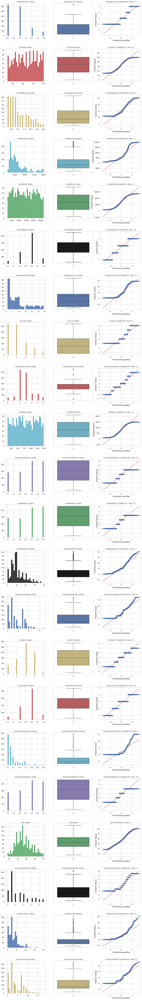

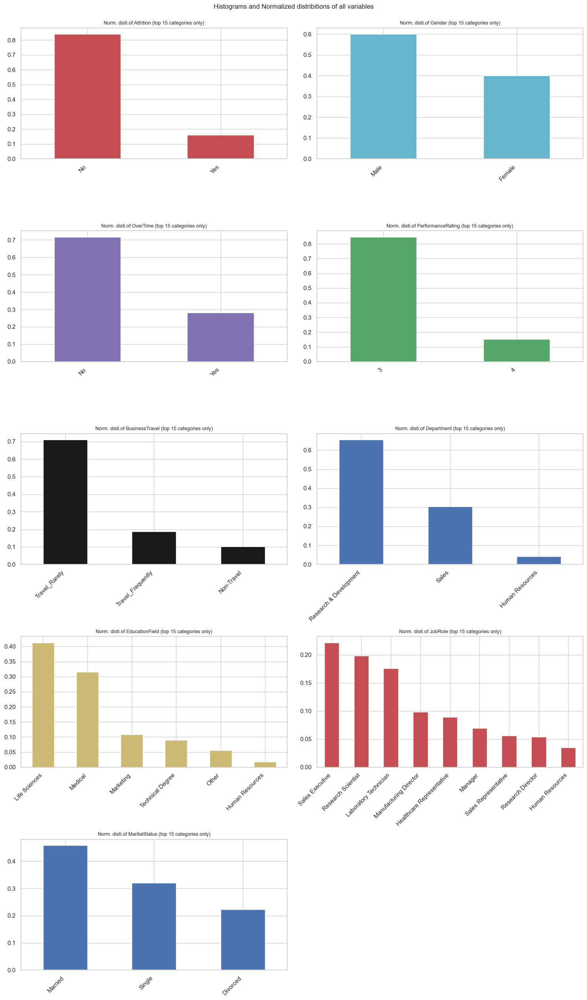

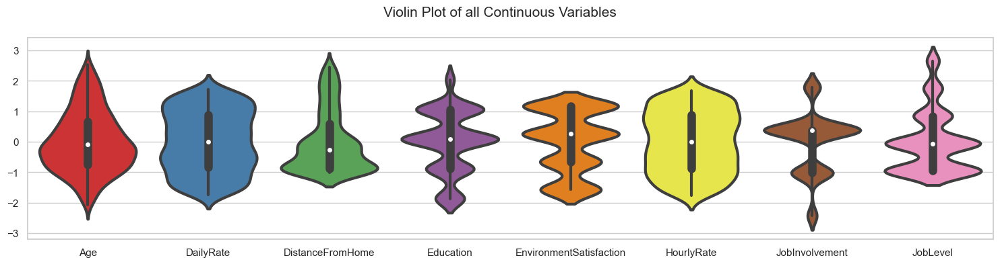

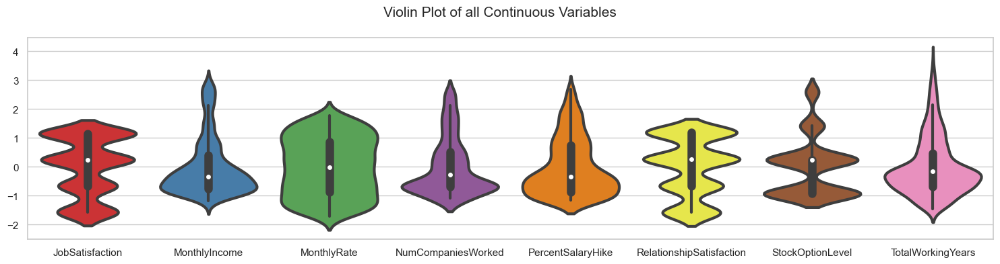

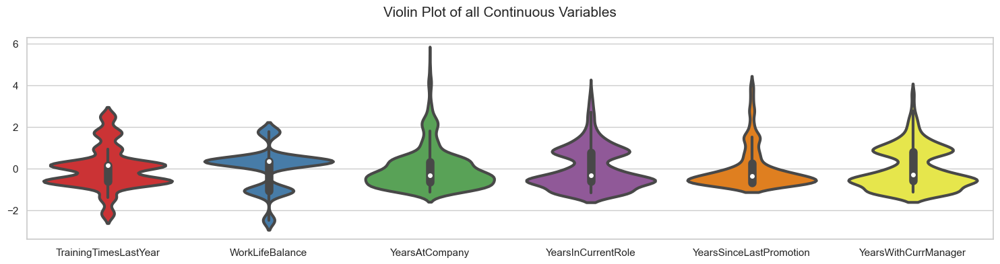

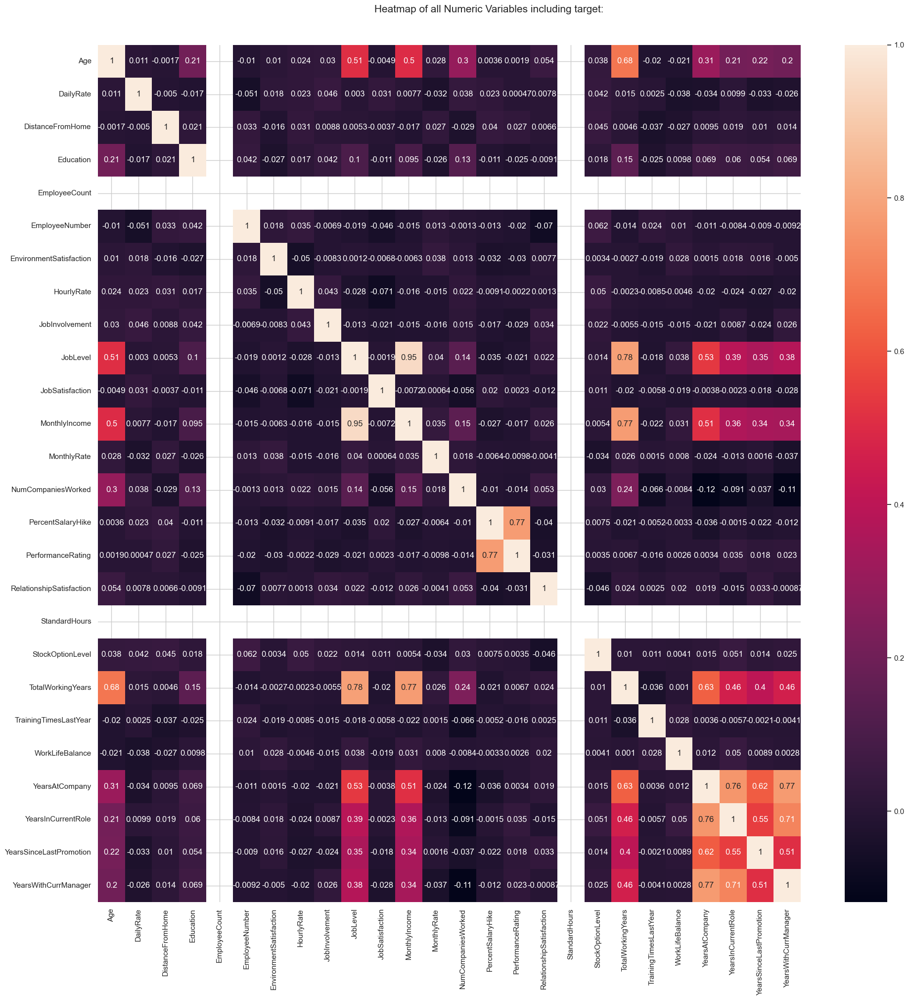

In [6]:
# Load Autoviz
from autoviz import AutoViz_Class
%matplotlib inline

Av = AutoViz_Class()

viz = Av.AutoViz(filename, sep=',',save_plot_dir='../reports',verbose=2)

# Data Preprocessing

## Data Quality

The automated EDA using sweetviz and AutoViz indicate that there are:
1. No missing values
2. No duplicates

The following features do not contain meaningful information as they contain only 1 unique value:
- `Over18`
- `EmployeeCount`
- `StandardHours`

`EmployeeNumber`, which is identifiable information, was also removed to avoid data leakage.

In [7]:
df_processed = df.drop(['Over18', 'EmployeeCount', 'StandardHours', 'EmployeeNumber'], axis=1)
print(df_processed.shape)

(1470, 31)


## Business Logic
The following conditions must be met to ensure sound business logic:
1. Time and distance-related attributes must all be positive
2. `Age` should be between 18 and 65 years old
3. `TotalWorkingYears` should be less than or equal to 45
4. `NumCompaniesWorked` should be greater or equal to 1
5. Career information  should meet the following rules:
-  `TotalWorkingYears` >= `YearsAtCompany`
- `YearsAtCompany` >= `YearsInCurrentRole`
- `YearsAtCompany` >= `YearsWithCurrManager`
- `YearsAtCompany` >= `YearsSinceLastPromotion`


In [8]:
# Import packages
import numpy as np

In [9]:
# Check if all time and distance related attributes are positive
time_var = ['Age', 'DistanceFromHome', 'TotalWorkingYears', 'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion', 'YearsWithCurrManager']

print("Number of negative values in time and distance related attributes")
for var in time_var:
    print(var + ": " + str(sum(np.logical_not(df_processed[var]>=0))))

Number of negative values in time and distance related attributes
Age: 0
DistanceFromHome: 0
TotalWorkingYears: 0
YearsAtCompany: 0
YearsInCurrentRole: 0
YearsSinceLastPromotion: 0
YearsWithCurrManager: 0


In [10]:
# Check if age is between 18 and 65 years old
print("Number of age values outside of 18-65 range: "
      + str(sum(np.logical_not(np.logical_and(df_processed['Age']>=18, df_processed['Age']<=65)))))

Number of age values outside of 18-65 range: 0


In [11]:
# Check if TotalWorkingYears is less than or equal to 45
print("Number of TotalWorkingYears values not less than or equal to 45: "
      + str(sum(np.logical_not(df_processed['TotalWorkingYears']<=45))))

Number of TotalWorkingYears values not less than or equal to 45: 0


In [12]:
# Check if NumCompaniesWorked should be greater or equal to 1
print("Number of NumCompaniesWorked values not greater or equal to 1: "
      + str(sum(np.logical_not(df_processed['NumCompaniesWorked']>=1))))

Number of NumCompaniesWorked values not greater or equal to 1: 197


In [13]:
# Check if TotalWorkingYears >= YearsAtCompany
print("Number of TotalWorkingYears values not greater or equal to YearsAtCompany: "
      + str(sum(np.logical_not(df_processed['TotalWorkingYears']>=df_processed['YearsAtCompany']))))

Number of TotalWorkingYears values not greater or equal to YearsAtCompany: 0


In [14]:
# Check if YearsAtCompany >= YearsInCurrentRole
print("Number of YearsAtCompany values not greater or equal to YearsInCurrentRole: "
      + str(sum(np.logical_not(df_processed['YearsAtCompany']>=df_processed['YearsInCurrentRole']))))

Number of YearsAtCompany values not greater or equal to YearsInCurrentRole: 0


In [15]:
# Check if YearsAtCompany >= YearsWithCurrManager
print("Number of YearsAtCompany values not greater or equal to YearsWithCurrManager: "
      + str(sum(np.logical_not(df_processed['YearsAtCompany']>=df_processed['YearsWithCurrManager']))))

Number of YearsAtCompany values not greater or equal to YearsWithCurrManager: 0


In [16]:
# Check if YearsAtCompany >= YearsSinceLastPromotion
print("Number of YearsAtCompany values not greater or equal to YearsSinceLastPromotion: "
      + str(sum(np.logical_not(df_processed['YearsAtCompany']>=df_processed['YearsSinceLastPromotion']))))

Number of YearsAtCompany values not greater or equal to YearsSinceLastPromotion: 0


The number of `NumCompaniesWorked` values not greater or equal to 1 is 197, accounting for 13.4% of the rows. There is also a consistent pattern of  the total number of years of work being one year more than the number of
years spent in the company for these rows. Hence, `NumCompaniesWorked` = 0 is replaced
with `NumCompaniesWorked` = 1 in this case.



In [17]:
df_processed[df_processed['NumCompaniesWorked']<=0].loc[:,["TotalWorkingYears", "YearsAtCompany"]]

,TotalWorkingYears,YearsAtCompany
5,8,7
8,10,9
10,6,5
11,10,9
13,3,2
16,7,6
20,5,4
22,13,12
27,10,9
46,10,9


In [18]:
# Replace NumCompaniesWorked = 0 with NumCompaniesWorked = 1
df_processed.loc[df_processed['NumCompaniesWorked']==0,'NumCompaniesWorked'] = 1

In [19]:
sum(df_processed['NumCompaniesWorked']==0)

0

## Feature Engineering

New features are derived from the existing ones to obtain further insight into the stability, development, and salary of an employee's career. They are defined below:

1. $$
CompanyLoyaltyRatio = \frac{YearsAtCompany}{TotalWorkingYears}
$$

2. $$
PositionStagnationRatio = \frac{YearsSinceLastPromotion}{YearsAtCompany}
$$

3. $$
ManagementStabilityRatio = \frac{YearsWithCurrManager}{YearsAtCompany}
$$

4. $$
JobLevelSalaryRatio = \frac{MonthlyIncome}{AvgIncomeJobLevel}
$$

5. $$
DepartmentSalaryRatio = \frac{MonthlyIncome}{AvgIncomeDepartment}
$$

6. $$
EducationReturnRatio = \frac{MonthlyIncome}{AvgIncomeEducation}
$$

When `TotalWorkingYears = 0`, the `CompanyLoyaltyRatio` is NA. Since the employee has only worked in the current company for less  a full year, so the value is manually imputed as 1.

`PositionStagnationRatio` and `ManagementStabilityRatio` is calculated as NA when `YearsAtCompany = 0`. Since the employee has worked in
the company for less than a full year, these values are replaced with 1.

In [20]:
# Calculate the average by different groups
df_processed['AvgIncomeJobLevel'] = df_processed.groupby('JobLevel')['MonthlyIncome'].transform('mean')
df_processed['AvgIncomeDepartment'] = df_processed.groupby('Department')['MonthlyIncome'].transform('mean')
df_processed['AvgIncomeEducation'] = df_processed.groupby('Education')['MonthlyIncome'].transform('mean')


In [21]:
# Calculate the defined ratios
df_processed['CompanyLoyaltyRatio'] = df_processed['YearsAtCompany']/df_processed['TotalWorkingYears']
df_processed['PositionStagnationRatio'] = df_processed['YearsSinceLastPromotion']/df_processed['YearsAtCompany']
df_processed['ManagementStabilityRatio'] = df_processed['YearsWithCurrManager']/df_processed['YearsAtCompany']
df_processed['JobLevelSalaryRatio'] = df_processed['MonthlyIncome']/df_processed['AvgIncomeJobLevel']
df_processed['DepartmentSalaryRatio'] = df_processed['MonthlyIncome']/df_processed['AvgIncomeDepartment']
df_processed['EducationReturnRatio'] = df_processed['MonthlyIncome']/df_processed['AvgIncomeEducation']

# Drop average columns
df_processed.drop(['AvgIncomeJobLevel','AvgIncomeDepartment','AvgIncomeEducation'], axis=1, inplace=True)

In [22]:
# Check for NA values
new_var = ['CompanyLoyaltyRatio','PositionStagnationRatio','ManagementStabilityRatio',
           'JobLevelSalaryRatio','DepartmentSalaryRatio','EducationReturnRatio']
df_processed[new_var].isna().any()

CompanyLoyaltyRatio          True
PositionStagnationRatio      True
ManagementStabilityRatio     True
JobLevelSalaryRatio         False
DepartmentSalaryRatio       False
EducationReturnRatio        False
dtype: bool

In [23]:
# Fill NA with 1
df_processed.fillna(value=1,inplace=True)

In [24]:
# Check for NA
df_processed[new_var].isna().any()

CompanyLoyaltyRatio         False
PositionStagnationRatio     False
ManagementStabilityRatio    False
JobLevelSalaryRatio         False
DepartmentSalaryRatio       False
EducationReturnRatio        False
dtype: bool

In [25]:
df_processed.to_csv(r'..\data\interim\processed_data.csv', index= False)

In [26]:
df_processed.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 37 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Age                       1470 non-null   int64  
 1   Attrition                 1470 non-null   object 
 2   BusinessTravel            1470 non-null   object 
 3   DailyRate                 1470 non-null   int64  
 4   Department                1470 non-null   object 
 5   DistanceFromHome          1470 non-null   int64  
 6   Education                 1470 non-null   int64  
 7   EducationField            1470 non-null   object 
 8   EnvironmentSatisfaction   1470 non-null   int64  
 9   Gender                    1470 non-null   object 
 10  HourlyRate                1470 non-null   int64  
 11  JobInvolvement            1470 non-null   int64  
 12  JobLevel                  1470 non-null   int64  
 13  JobRole                   1470 non-null   object 
 14  JobSatis

## Data Transformation
- One Hot Encoding
- Normalization


In [27]:
# Load data
df_encoded = pd.read_csv(r'..\data\interim\processed_data.csv')

In [28]:
df_encoded['Gender'] = df_encoded['Gender'].apply(lambda x: 0 if x == 'Male' else 1)
df_encoded['Attrition'] = df_encoded['Attrition'].apply(lambda x: 1 if x == "Yes" else 0)
df_encoded['OverTime'] =  df_encoded['OverTime'].apply(lambda x: 1 if x == "Yes" else 0)

In [29]:
vars = df_encoded.dtypes.reset_index()
one_hot_vars = list(vars[vars[0] == 'object']['index'])
print(one_hot_vars)

['BusinessTravel', 'Department', 'EducationField', 'JobRole', 'MaritalStatus']


In [30]:
df_encoded = pd.get_dummies(df_encoded, columns=one_hot_vars, dtype=int, drop_first=False)

In [31]:
# Save to csv

df_encoded.to_csv(r'..\data\interim\encoded_data.csv', index= False)
df_encoded.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 56 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   Age                                1470 non-null   int64  
 1   Attrition                          1470 non-null   int64  
 2   DailyRate                          1470 non-null   int64  
 3   DistanceFromHome                   1470 non-null   int64  
 4   Education                          1470 non-null   int64  
 5   EnvironmentSatisfaction            1470 non-null   int64  
 6   Gender                             1470 non-null   int64  
 7   HourlyRate                         1470 non-null   int64  
 8   JobInvolvement                     1470 non-null   int64  
 9   JobLevel                           1470 non-null   int64  
 10  JobSatisfaction                    1470 non-null   int64  
 11  MonthlyIncome                      1470 non-null   int64

In [32]:
pd.set_option('display.max_columns', None)
df_encoded.describe()

,Age,Attrition,DailyRate,DistanceFromHome,Education,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,JobSatisfaction,MonthlyIncome,MonthlyRate,NumCompaniesWorked,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,CompanyLoyaltyRatio,PositionStagnationRatio,ManagementStabilityRatio,JobLevelSalaryRatio,DepartmentSalaryRatio,EducationReturnRatio,BusinessTravel_Non-Travel,BusinessTravel_Travel_Frequently,BusinessTravel_Travel_Rarely,Department_Human Resources,Department_Research & Development,Department_Sales,EducationField_Human Resources,EducationField_Life Sciences,EducationField_Marketing,EducationField_Medical,EducationField_Other,EducationField_Technical Degree,JobRole_Healthcare Representative,JobRole_Human Resources,JobRole_Laboratory Technician,JobRole_Manager,JobRole_Manufacturing Director,JobRole_Research Director,JobRole_Research Scientist,JobRole_Sales Executive,JobRole_Sales Representative,MaritalStatus_Divorced,MaritalStatus_Married,MaritalStatus_Single
count,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000
mean,36.923810,0.161224,802.485714,9.192517,2.912925,2.721769,0.400000,65.891156,2.729932,2.063946,2.728571,6502.931293,14313.103401,2.827211,0.282993,15.209524,3.153741,2.712245,0.793878,11.279592,2.799320,2.761224,7.008163,4.229252,2.187755,4.123129,0.685557,0.320164,0.588557,1.000000,1.000000,1.000000,0.102041,0.188435,0.709524,0.042857,0.653741,0.303401,0.018367,0.412245,0.108163,0.315646,0.055782,0.089796,0.089116,0.035374,0.176190,0.069388,0.098639,0.054422,0.198639,0.221769,0.056463,0.222449,0.457823,0.319728
std,9.135373,0.367863,403.509100,8.106864,1.024165,1.093082,0.490065,20.329428,0.711561,1.106940,1.102846,4707.956783,7117.786044,2.373571,0.450606,3.659938,0.360824,1.081209,0.852077,7.780782,1.289271,0.706476,6.126525,3.623137,3.222430,3.568136,0.323916,0.357245,0.328081,0.237622,0.729380,0.723624,0.302805,0.391193,0.454137,0.202604,0.475939,0.459884,0.134321,0.492406,0.310692,0.464931,0.229579,0.285986,0.285008,0.184786,0.381112,0.254199,0.298279,0.226925,0.399112,0.415578,0.230891,0.416033,0.498387,0.466530
min,18.000000,0.000000,102.000000,1.000000,1.000000,1.000000,0.000000,30.000000,1.000000,1.000000,1.000000,1009.000000,2094.000000,1.000000,0.000000,11.000000,3.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.362049,0.151167,0.165867,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,30.000000,0.000000,465.000000,2.000000,2.000000,2.000000,0.000000,48.000000,2.000000,1.000000,2.000000,2911.000000,8047.000000,1.000000,0.000000,12.000000,3.000000,2.000000,0.000000,6.000000,2.000000,2.000000,3.000000,2.000000,0.000000,2.000000,0.428571,0.000000,0.400000,0.840356,0.455841,0.456979,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,36.000000,0.000000,802.000000,7.000000,3.000000,3.000000,0.000000,66.00000

In [33]:
df_normalized = df_encoded[:]

# Obtain variables to be normalized

normalized_vars = []
for var in df_normalized.columns:
    if df_normalized[var].max()>5:
      normalized_vars.append(var)

print(normalized_vars)

['Age', 'DailyRate', 'DistanceFromHome', 'HourlyRate', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked', 'PercentSalaryHike', 'TotalWorkingYears', 'TrainingTimesLastYear', 'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion', 'YearsWithCurrManager']


In [34]:
# Normalize variables

for var in normalized_vars:
    df_normalized[var] = (df_normalized[var] - df_normalized[var].mean()) / df_normalized[var].std()

In [35]:
# Save to csv

df_normalized.to_csv(r'..\data\interim\normalized_data.csv', index= False)

# Data Split and Sampling Methods

## Data Split

In [36]:
# Import packages
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split

In [37]:
# Import data
df_normalized = pd.read_csv(r'..\data\interim\normalized_data.csv')

column_to_move = df_normalized.pop("Attrition")
# insert column with insert(location, column_name, column_value)

df_normalized.insert(len(df_normalized.columns), "Attrition", column_to_move)
print(df_normalized.shape)

(1470, 56)


In [38]:
train_set, test_set = train_test_split(df_normalized, random_state=123, test_size = 0.3)
print(train_set.shape)
print(test_set.shape)

(1029, 56)
(441, 56)


In [39]:
train_set.to_csv(r'..\data\processed\train_set.csv', index=False)
test_set.to_csv(r'..\data\processed\test_set.csv', index=False)